## Data Preparation

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import mplleaflet
import json

%matplotlib inline

In [2]:
#Read in the HDB file
hdb = pd.read_csv('./resale-flat-prices/resale-flat-prices-based-on-registration-date-from-jan-2015-onwards.csv')

In [3]:
hdb.head()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,07 TO 09,60.0,Improved,1986,70,255000.0
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1981,65,275000.0
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,01 TO 03,69.0,New Generation,1980,64,285000.0
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1979,63,290000.0
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,07 TO 09,68.0,New Generation,1980,64,290000.0


In [4]:
#Correct the typo for 'Premium Apartment.'
hdb['flat_model'] = [name[:-1] if name == 'Premium Apartment.' else name for name in hdb['flat_model']]

In [5]:
hdb.shape

(79100, 11)

In [6]:
#Create a new column consisting of the search terms to be entered into HERE maps API search query
hdb['HERE_address'] = [hdb.loc[index]['block']+' '+hdb.loc[index]['street_name']+' '+'Singapore' for index in range(len(hdb))]

In [7]:
#Check the new columns
hdb.head()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,HERE_address
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,07 TO 09,60.0,Improved,1986,70,255000.0,174 ANG MO KIO AVE 4 Singapore
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1981,65,275000.0,541 ANG MO KIO AVE 10 Singapore
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,01 TO 03,69.0,New Generation,1980,64,285000.0,163 ANG MO KIO AVE 4 Singapore
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1979,63,290000.0,446 ANG MO KIO AVE 10 Singapore
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,07 TO 09,68.0,New Generation,1980,64,290000.0,557 ANG MO KIO AVE 10 Singapore


In [8]:
hdb.tail()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,HERE_address
79095,2018-12,YISHUN,5 ROOM,760,YISHUN ST 72,10 TO 12,122.0,Improved,1987,67,470000.0,760 YISHUN ST 72 Singapore
79096,2018-12,YISHUN,5 ROOM,816,YISHUN ST 81,04 TO 06,122.0,Improved,1988,68,500000.0,816 YISHUN ST 81 Singapore
79097,2018-12,YISHUN,5 ROOM,844,YISHUN ST 81,10 TO 12,127.0,Improved,1988,69,500000.0,844 YISHUN ST 81 Singapore
79098,2018-12,YISHUN,EXECUTIVE,665,YISHUN AVE 4,07 TO 09,164.0,Apartment,1992,72,708000.0,665 YISHUN AVE 4 Singapore
79099,2018-12,YISHUN,EXECUTIVE,326,YISHUN RING RD,10 TO 12,146.0,Maisonette,1988,68,560000.0,326 YISHUN RING RD Singapore


## Testing requests and saving data retrieved.

In [9]:
import requests

In [10]:
#Try retrieving address  geodata using HERE's example

app_id = 
app_code = 
address = '174 ANG MO KIO AVE 4 SINGAPORE'

resp = requests.get('https://geocoder.api.here.com/6.2/geocode.json?app_id={}&app_code={}&searchtext={}'.format(app_id,app_code,address))
resp.status_code

200

In [11]:
json.loads(resp.text)

{'Response': {'MetaInfo': {'Timestamp': '2019-03-04T12:10:56.786+0000'},
  'View': [{'_type': 'SearchResultsViewType',
    'ViewId': 0,
    'Result': [{'Relevance': 1.0,
      'MatchLevel': 'houseNumber',
      'MatchQuality': {'City': 1.0, 'Street': [1.0], 'HouseNumber': 1.0},
      'MatchType': 'pointAddress',
      'Location': {'LocationId': 'NT_Mqhghz7wgCZ10tgfNxL5MC_xcDN',
       'LocationType': 'point',
       'DisplayPosition': {'Latitude': 1.37513, 'Longitude': 103.83788},
       'NavigationPosition': [{'Latitude': 1.37541, 'Longitude': 103.8374}],
       'MapView': {'TopLeft': {'Latitude': 1.3762542,
         'Longitude': 103.8367555},
        'BottomRight': {'Latitude': 1.3740058, 'Longitude': 103.8390045}},
       'Address': {'Label': '174 Ang Mo Kio Ave 4, Singapore 560174, Singapore',
        'Country': 'SGP',
        'County': 'Singapore',
        'City': 'Singapore',
        'District': 'Ang Mo Kio',
        'Street': 'Ang Mo Kio Ave 4',
        'HouseNumber': '174',
   

In [12]:
#Retrieve latitude and longitude
print(json.loads(resp.text)['Response']['View'][0]['Result'][0]['Location']['NavigationPosition'][0]['Latitude'])
print(json.loads(resp.text)['Response']['View'][0]['Result'][0]['Location']['NavigationPosition'][0]['Longitude'])

1.37541
103.8374


In [13]:
hdb_unique_blocks = hdb.drop_duplicates(subset=('HERE_address')).copy()

In [14]:
hdb_unique_blocks.shape

(8512, 12)

In [15]:
hdb_unique_blocks.head()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,HERE_address
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,07 TO 09,60.0,Improved,1986,70,255000.0,174 ANG MO KIO AVE 4 Singapore
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1981,65,275000.0,541 ANG MO KIO AVE 10 Singapore
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,01 TO 03,69.0,New Generation,1980,64,285000.0,163 ANG MO KIO AVE 4 Singapore
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1979,63,290000.0,446 ANG MO KIO AVE 10 Singapore
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,07 TO 09,68.0,New Generation,1980,64,290000.0,557 ANG MO KIO AVE 10 Singapore


## Retrieve and save the geodata for all houses

In [16]:
def retrieve_lat_long(series):
    """
    This function takes in a Series and sends requests to HERE Maps API to save retrieve geodata json as a text file and 
    address name, latitude and longitude as a csv file
    """
    #Create a dictionary to save JSON responses
    json_responses = {}
    
    #Create empty lists to concatenate to before they are turned into a DataFrame 
    #(computationally less intense then iteratively concatenating to a DataFrame)
    addresses = []
    latitudes = []
    longitudes = []
    
    #
    app_id = 
    app_code = 
    
    #Iterate through the series of addresses
    for i,address in enumerate(series):
        #request geodata from HERE maps API
        response = requests.get("https://geocoder.api.here.com/6.2/geocode.json?app_id={}&app_code={}&searchtext={}".format(app_id, app_code, address))
        
        #if request is successful, save the full geodata JSON (keep the full data just in case)  
        if response.status_code == 200:
            json_responses[address]=json.loads(response.text)
            
            #Append the address, latitude and longitude information
            addresses.append(address)
            try:
                latitudes.append(json.loads(response.text)['Response']['View'][0]['Result'][0]['Location']['NavigationPosition'][0]['Latitude'])
            except:
                print('Unable to save latitude from: {}'.format(address))
                latitudes.append(None)
            try:
                longitudes.append(json.loads(response.text)['Response']['View'][0]['Result'][0]['Location']['NavigationPosition'][0]['Longitude'])
            except:
                print('Unable to save longtitude from: {}'.format(address))
                longitudes.append(None)
        else:
            #if response fails, print the address and the corresponding status code
            print(address, 'status: ', response.status_code)
            
            #Record JSON and geodata information as None
            json_responses[address]=None
            adresses.append(address)
            latitudes.append(None)
            longitudes.append(None)
        
        #Save retrieved information periodically
        if i%250 == 0:
            print('Saving JSON, {} addresses done.'.format(i+1),end=' ')
            
            #Save the full JSON response as text file (do not overwrite, have back-ups)
            with open('json_save_{}.txt'.format(i), 'w') as outfile:  
                json.dump(json_responses, outfile)
            
            #Create the DataFrame and save as csv (do not overwrite, have back-ups)
            lat_long = pd.DataFrame({'Address':addresses,'Latitude':latitudes,'Longitude':longitudes})
            lat_long.to_csv('lat_long_{}.csv'.format(i))
    
    #After all addresses are complete, print message
    print('Saving JSON, {} addresses done. All addresses completed.'.format(i+1))
            
    #Save the full JSON response as text file 
    with open('json_save_complete.txt', 'w') as outfile:  
        json.dump(json_responses, outfile)
        
    #Create the DataFrame and save as csv
    lat_long = pd.DataFrame({'Address':addresses,'Latitude':latitudes,'Longitude':longitudes})
    lat_long.to_csv('lat_long_complete.csv')

In [17]:
#Test on 6 addresses
retrieve_lat_long(hdb_unique_blocks['HERE_address'][:6])

Saving JSON, 1 addresses done. Saving JSON, 6 addresses done. All addresses completed.


In [18]:
#Check the csv saved 
test = pd.read_csv('./lat_long_complete.csv',index_col=0)
test

,Address,Latitude,Longitude
0,174 ANG MO KIO AVE 4 Singapore,1.37541,103.83740
1,541 ANG MO KIO AVE 10 Singapore,1.37412,103.85576
2,163 ANG MO KIO AVE 4 Singapore,1.37387,103.83834
3,446 ANG MO KIO AVE 10 Singapore,1.36794,103.85543
4,557 ANG MO KIO AVE 10 Singapore,1.37145,103.85785
5,603 ANG MO KIO AVE 5 Singapore,1.38040,103.83560


In [19]:
#check the json saved 
with open('./json_save_complete.txt') as json_file:
    test_json = json.load(json_file)

test_json

{'174 ANG MO KIO AVE 4 Singapore': {'Response': {'MetaInfo': {'Timestamp': '2019-03-04T12:10:56.908+0000'},
   'View': [{'_type': 'SearchResultsViewType',
     'ViewId': 0,
     'Result': [{'Relevance': 1.0,
       'MatchLevel': 'houseNumber',
       'MatchQuality': {'City': 1.0, 'Street': [1.0], 'HouseNumber': 1.0},
       'MatchType': 'pointAddress',
       'Location': {'LocationId': 'NT_Mqhghz7wgCZ10tgfNxL5MC_xcDN',
        'LocationType': 'point',
        'DisplayPosition': {'Latitude': 1.37513, 'Longitude': 103.83788},
        'NavigationPosition': [{'Latitude': 1.37541, 'Longitude': 103.8374}],
        'MapView': {'TopLeft': {'Latitude': 1.3762542,
          'Longitude': 103.8367555},
         'BottomRight': {'Latitude': 1.3740058, 'Longitude': 103.8390045}},
        'Address': {'Label': '174 Ang Mo Kio Ave 4, Singapore 560174, Singapore',
         'Country': 'SGP',
         'County': 'Singapore',
         'City': 'Singapore',
         'District': 'Ang Mo Kio',
         'Street':

In [20]:
#Retrieve all HDB
retrieve_lat_long(hdb_unique_blocks['HERE_address'])

Saving JSON, 1 addresses done. Saving JSON, 251 addresses done. Saving JSON, 501 addresses done. Saving JSON, 751 addresses done. Saving JSON, 1001 addresses done. Saving JSON, 1251 addresses done. Saving JSON, 1501 addresses done. Saving JSON, 1751 addresses done. Saving JSON, 2001 addresses done. Saving JSON, 2251 addresses done. Saving JSON, 2501 addresses done. Saving JSON, 2751 addresses done. Saving JSON, 3001 addresses done. Saving JSON, 3251 addresses done. Saving JSON, 3501 addresses done. Saving JSON, 3751 addresses done. Saving JSON, 4001 addresses done. Saving JSON, 4251 addresses done. Saving JSON, 4501 addresses done. Saving JSON, 4751 addresses done. Saving JSON, 5001 addresses done. Saving JSON, 5251 addresses done. Saving JSON, 5501 addresses done. Saving JSON, 5751 addresses done. Saving JSON, 6001 addresses done. Saving JSON, 6251 addresses done. Saving JSON, 6501 addresses done. Saving JSON, 6751 addresses done. Saving JSON, 7001 addresses done. Saving JSON, 7251 ad

In [21]:
#Check length of requests retrieved 
with open('./json_save_complete.txt') as json_file:
    unique_json = json.load(json_file)

len(unique_json)

8512

In [22]:
unique_json['174 ANG MO KIO AVE 4 Singapore']

{'Response': {'MetaInfo': {'Timestamp': '2019-03-04T12:10:56.908+0000'},
  'View': [{'_type': 'SearchResultsViewType',
    'ViewId': 0,
    'Result': [{'Relevance': 1.0,
      'MatchLevel': 'houseNumber',
      'MatchQuality': {'City': 1.0, 'Street': [1.0], 'HouseNumber': 1.0},
      'MatchType': 'pointAddress',
      'Location': {'LocationId': 'NT_Mqhghz7wgCZ10tgfNxL5MC_xcDN',
       'LocationType': 'point',
       'DisplayPosition': {'Latitude': 1.37513, 'Longitude': 103.83788},
       'NavigationPosition': [{'Latitude': 1.37541, 'Longitude': 103.8374}],
       'MapView': {'TopLeft': {'Latitude': 1.3762542,
         'Longitude': 103.8367555},
        'BottomRight': {'Latitude': 1.3740058, 'Longitude': 103.8390045}},
       'Address': {'Label': '174 Ang Mo Kio Ave 4, Singapore 560174, Singapore',
        'Country': 'SGP',
        'County': 'Singapore',
        'City': 'Singapore',
        'District': 'Ang Mo Kio',
        'Street': 'Ang Mo Kio Ave 4',
        'HouseNumber': '174',
   

In [23]:
#Save the file under a new name in case additional pulls are done
with open('json_save_first_pull.txt', 'w') as outfile:  
        json.dump(unique_json, outfile)

In [24]:
#Check csv retrieved 
retrieved_latlong = pd.read_csv('./lat_long_complete.csv',index_col = 0)
retrieved_latlong.head()

,Address,Latitude,Longitude
0,174 ANG MO KIO AVE 4 Singapore,1.37541,103.83740
1,541 ANG MO KIO AVE 10 Singapore,1.37412,103.85576
2,163 ANG MO KIO AVE 4 Singapore,1.37387,103.83834
3,446 ANG MO KIO AVE 10 Singapore,1.36794,103.85543
4,557 ANG MO KIO AVE 10 Singapore,1.37145,103.85785


In [25]:
#Check the shape of the DataFrame of retrieved information
retrieved_latlong.shape

(8512, 3)

In [26]:
#Check the shape DataFrame of the unique HDB blocks
hdb_unique_blocks.shape

(8512, 12)

In [27]:
#Save the file under a new name in case additional pulls are done
retrieved_latlong.to_csv('lat_long_unique_first_pull.csv')

In [28]:
#Concatenate the two DataFrames
unique_hdb_wlatlong = pd.concat([hdb_unique_blocks.reset_index(drop=True),retrieved_latlong],axis=1)

In [29]:
#Check the shape of the concatenated DataFrame
unique_hdb_wlatlong.shape

(8512, 15)

In [30]:
unique_hdb_wlatlong.tail()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,HERE_address,Address,Latitude,Longitude
8507,2018-12,WOODLANDS,4 ROOM,782A,WOODLANDS CRES,07 TO 09,92.0,Model A,2015,95,396500.0,782A WOODLANDS CRES Singapore,782A WOODLANDS CRES Singapore,1.44735,103.80254
8508,2018-12,WOODLANDS,EXECUTIVE,117,MARSILING RISE,01 TO 03,170.0,Apartment,1995,75,685000.0,117 MARSILING RISE Singapore,117 MARSILING RISE Singapore,1.43836,103.78007
8509,2018-12,YISHUN,4 ROOM,348A,YISHUN AVE 11,10 TO 12,92.0,DBSS,2013,93,600000.0,348A YISHUN AVE 11 Singapore,348A YISHUN AVE 11 Singapore,1.42719,103.84126
8510,2018-12,YISHUN,4 ROOM,347B,YISHUN AVE 11,10 TO 12,92.0,DBSS,2013,93,530000.0,347B YISHUN AVE 11 Singapore,347B YISHUN AVE 11 Singapore,1.42789,103.84212
8511,2018-12,YISHUN,5 ROOM,348C,YISHUN AVE 11,13 TO 15,112.0,DBSS,2013,93,710000.0,348C YISHUN AVE 11 Singapore,348C YISHUN AVE 11 Singapore,1.42697,103.84230


In [31]:
def check_hdb(series):
    """
    DOCSTRING: Used to compared the original house number and street name against the retrieved house number and street name
    INPUT:Row from DataFrame
    OUTPUT: number of matches, retrieved house number and street
    """

    #Extract street and house number for comparison
    try:
        house_num = unique_json[series[11]]['Response']['View'][0]['Result'][0]['Location']['Address']['HouseNumber']
    except:
        house_num = None
    try: 
        street = unique_json[series[11]]['Response']['View'][0]['Result'][0]['Location']['Address']['Street']
    except:
        street = None
    
    score = 0
    
    #Add one to the score if the entries match
    if series[3] == house_num:
        score+=1
    if series[4].lower() == street.lower():
        score+=1
        
    return [score,house_num, street]
    

In [32]:
check_results = unique_hdb_wlatlong.apply(check_hdb,axis=1)

In [33]:
scores = [result[0] for result in check_results]
address = [(result[1],result[2]) for result in check_results]

In [34]:
unique_hdb_wlatlong['score']=scores
unique_hdb_wlatlong['retrieved_address']=address

In [35]:
unique_hdb_wlatlong[unique_hdb_wlatlong['score']!=2][['Address','retrieved_address']]

,Address,retrieved_address
57,38 BEDOK STH RD Singapore,"(38, Bedok South Rd)"
58,504 BEDOK NTH ST 3 Singapore,"(504, Bedok North St 3)"
59,545 BEDOK NTH ST 3 Singapore,"(545, Bedok North St 3)"
60,546 BEDOK NTH ST 3 Singapore,"(546, Bedok North St 3)"
61,18 BEDOK STH RD Singapore,"(18, Bedok South Rd)"
62,550 BEDOK NTH AVE 1 Singapore,"(550, Bedok North Ave 1)"
63,502 BEDOK NTH ST 3 Singapore,"(502, Bedok North St 3)"
64,509 BEDOK NTH ST 3 Singapore,"(509, Bedok North St 3)"
65,525 BEDOK NTH ST 3 Singapore,"(525, Bedok North St 3)"
66,534 BEDOK NTH ST 3 Singapore,"(534, Bedok North St 3)"


<div class="alert alert-block alert-warning">
Seems like most of the errors were due to abbreviations but they are actually accurate. Look at cases where even the street number did not match up.
</div>

In [36]:
#Check for 0 matches
unique_hdb_wlatlong[unique_hdb_wlatlong['score']==0][['Address','retrieved_address','Latitude','Longitude']]

,Address,retrieved_address,Latitude,Longitude
732,83 C'WEALTH CL Singapore,"(None, Commonwealth Clos)",1.30324,103.80005
1665,85 C'WEALTH CL Singapore,"(None, Commonwealth Clos)",1.30324,103.80005
2514,88 C'WEALTH CL Singapore,"(None, Commonwealth Clos)",1.30324,103.80005
2515,84 C'WEALTH CL Singapore,"(None, Commonwealth Clos)",1.30324,103.80005
3342,81 C'WEALTH CL Singapore,"(None, Commonwealth Clos)",1.30324,103.80005
3343,87 C'WEALTH CL Singapore,"(None, Commonwealth Clos)",1.30324,103.80005
4035,86 C'WEALTH CL Singapore,"(None, Commonwealth Clos)",1.30324,103.80005
4638,82 C'WEALTH CL Singapore,"(None, Commonwealth Clos)",1.30324,103.80005


In [37]:
#Try changing the name of C'WEALTH CL to Commonwealth Clos
address = '83 Commonwealth Clos, Singapore'

testing = requests.get('https://geocoder.api.here.com/6.2/geocode.json?app_id={}&app_code={}&searchtext={}'.format(app_id,app_code,address))
testing.status_code

200

In [38]:
json.loads(testing.text)

{'Response': {'MetaInfo': {'Timestamp': '2019-03-04T12:18:02.719+0000'},
  'View': [{'_type': 'SearchResultsViewType',
    'ViewId': 0,
    'Result': [{'Relevance': 1.0,
      'MatchLevel': 'houseNumber',
      'MatchQuality': {'City': 1.0, 'Street': [1.0], 'HouseNumber': 1.0},
      'MatchType': 'pointAddress',
      'Location': {'LocationId': 'NT_fA7eXQPGu0NO7vlzRPUHnB_4MD',
       'LocationType': 'point',
       'DisplayPosition': {'Latitude': 1.30468, 'Longitude': 103.80039},
       'NavigationPosition': [{'Latitude': 1.3046, 'Longitude': 103.80066}],
       'MapView': {'TopLeft': {'Latitude': 1.3058042,
         'Longitude': 103.7992656},
        'BottomRight': {'Latitude': 1.3035558, 'Longitude': 103.8015144}},
       'Address': {'Label': '83 Commonwealth Clos, Singapore 140083, Singapore',
        'Country': 'SGP',
        'County': 'Singapore',
        'City': 'Singapore',
        'District': 'Queenstown',
        'Street': 'Commonwealth Clos',
        'HouseNumber': '83',
    

In [39]:
#Create a new list of addresses to retrieve geodata (retain the original order of easy DataFrame updating later on)
hdb_addon = [str(num)+' Commonwealth Clos, Singapore' for num in [83,85,88,84,81,87,86,82]]
hdb_addon

['83 Commonwealth Clos, Singapore',
 '85 Commonwealth Clos, Singapore',
 '88 Commonwealth Clos, Singapore',
 '84 Commonwealth Clos, Singapore',
 '81 Commonwealth Clos, Singapore',
 '87 Commonwealth Clos, Singapore',
 '86 Commonwealth Clos, Singapore',
 '82 Commonwealth Clos, Singapore']

In [40]:
#Retrieved the corrected Commonwealth Close lat long
retrieve_lat_long(hdb_addon)

Saving JSON, 1 addresses done. Saving JSON, 8 addresses done. All addresses completed.


In [41]:
with open('./json_save_complete.txt') as json_file:
    json_commonwealth = json.load(json_file)

json_commonwealth

{'83 Commonwealth Clos, Singapore': {'Response': {'MetaInfo': {'Timestamp': '2019-03-04T12:18:02.719+0000'},
   'View': [{'_type': 'SearchResultsViewType',
     'ViewId': 0,
     'Result': [{'Relevance': 1.0,
       'MatchLevel': 'houseNumber',
       'MatchQuality': {'City': 1.0, 'Street': [1.0], 'HouseNumber': 1.0},
       'MatchType': 'pointAddress',
       'Location': {'LocationId': 'NT_fA7eXQPGu0NO7vlzRPUHnB_4MD',
        'LocationType': 'point',
        'DisplayPosition': {'Latitude': 1.30468, 'Longitude': 103.80039},
        'NavigationPosition': [{'Latitude': 1.3046, 'Longitude': 103.80066}],
        'MapView': {'TopLeft': {'Latitude': 1.3058042,
          'Longitude': 103.7992656},
         'BottomRight': {'Latitude': 1.3035558, 'Longitude': 103.8015144}},
        'Address': {'Label': '83 Commonwealth Clos, Singapore 140083, Singapore',
         'Country': 'SGP',
         'County': 'Singapore',
         'City': 'Singapore',
         'District': 'Queenstown',
         'Street':

In [42]:
#Check the retrieved geodata
latlong_commonwealth = pd.read_csv('./lat_long_complete.csv',index_col=0)
latlong_commonwealth

,Address,Latitude,Longitude
0,"83 Commonwealth Clos, Singapore",1.30460,103.80066
1,"85 Commonwealth Clos, Singapore",1.30364,103.79915
2,"88 Commonwealth Clos, Singapore",1.30479,103.79884
3,"84 Commonwealth Clos, Singapore",1.30360,103.79917
4,"81 Commonwealth Clos, Singapore",1.30407,103.80091
5,"87 Commonwealth Clos, Singapore",1.30449,103.79913
6,"86 Commonwealth Clos, Singapore",1.30449,103.79913
7,"82 Commonwealth Clos, Singapore",1.30407,103.80091


In [43]:
#Check the entries to be updated
retrieved_latlong[retrieved_latlong['Address'].str.contains("C'WEALTH CL")][['Address','Latitude','Longitude']]

,Address,Latitude,Longitude
732,83 C'WEALTH CL Singapore,1.30324,103.80005
1665,85 C'WEALTH CL Singapore,1.30324,103.80005
2514,88 C'WEALTH CL Singapore,1.30324,103.80005
2515,84 C'WEALTH CL Singapore,1.30324,103.80005
3342,81 C'WEALTH CL Singapore,1.30324,103.80005
3343,87 C'WEALTH CL Singapore,1.30324,103.80005
4035,86 C'WEALTH CL Singapore,1.30324,103.80005
4638,82 C'WEALTH CL Singapore,1.30324,103.80005


In [44]:
#Retrieve the index of values to change
index_to_change = retrieved_latlong[retrieved_latlong['Address'].str.contains("C'WEALTH CL")].index

In [45]:
#Match the index of the correct latlong entries to the original index
latlong_commonwealth.index = index_to_change

In [46]:
#Update the DataFrame with corrected values
retrieved_latlong.update(latlong_commonwealth[['Latitude','Longitude']])

In [47]:
#Check that values are updated
retrieved_latlong[retrieved_latlong['Address'].str.contains("C'WEALTH CL")]

,Address,Latitude,Longitude
732,83 C'WEALTH CL Singapore,1.30460,103.80066
1665,85 C'WEALTH CL Singapore,1.30364,103.79915
2514,88 C'WEALTH CL Singapore,1.30479,103.79884
2515,84 C'WEALTH CL Singapore,1.30360,103.79917
3342,81 C'WEALTH CL Singapore,1.30407,103.80091
3343,87 C'WEALTH CL Singapore,1.30449,103.79913
4035,86 C'WEALTH CL Singapore,1.30449,103.79913
4638,82 C'WEALTH CL Singapore,1.30407,103.80091


In [48]:
#Merge the retrieved geodata to the full hdb DataFrame
hdb_w_latlong = hdb.merge(retrieved_latlong, how='inner', left_on='HERE_address', right_on='Address')
hdb_w_latlong.drop('Address',axis=1,inplace=True)

In [49]:
hdb_w_latlong.tail()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,HERE_address,Latitude,Longitude
79095,2018-12,WOODLANDS,4 ROOM,782A,WOODLANDS CRES,07 TO 09,92.0,Model A,2015,95,396500.0,782A WOODLANDS CRES Singapore,1.44735,103.80254
79096,2018-12,WOODLANDS,EXECUTIVE,117,MARSILING RISE,01 TO 03,170.0,Apartment,1995,75,685000.0,117 MARSILING RISE Singapore,1.43836,103.78007
79097,2018-12,YISHUN,4 ROOM,348A,YISHUN AVE 11,10 TO 12,92.0,DBSS,2013,93,600000.0,348A YISHUN AVE 11 Singapore,1.42719,103.84126
79098,2018-12,YISHUN,4 ROOM,347B,YISHUN AVE 11,10 TO 12,92.0,DBSS,2013,93,530000.0,347B YISHUN AVE 11 Singapore,1.42789,103.84212
79099,2018-12,YISHUN,5 ROOM,348C,YISHUN AVE 11,13 TO 15,112.0,DBSS,2013,93,710000.0,348C YISHUN AVE 11 Singapore,1.42697,103.84230


In [50]:
hdb_unique_blocks = hdb_w_latlong.drop_duplicates(subset=('HERE_address')).copy()

In [51]:
#save the updated DataFrame
hdb_w_latlong.to_csv('hdb_inc_latlong.csv')

In [52]:
#Check for unusual values/variance
hdb_w_latlong[['Latitude','Longitude']].describe()

,Latitude,Longitude
count,79100.000000,79100.000000
mean,1.365693,103.839123
std,0.042690,0.072630
min,1.270390,103.685260
25%,1.336190,103.774700
50%,1.363160,103.844920
75%,1.392580,103.899020
max,1.456910,103.987980


Text(0, 0.5, 'Latitude')

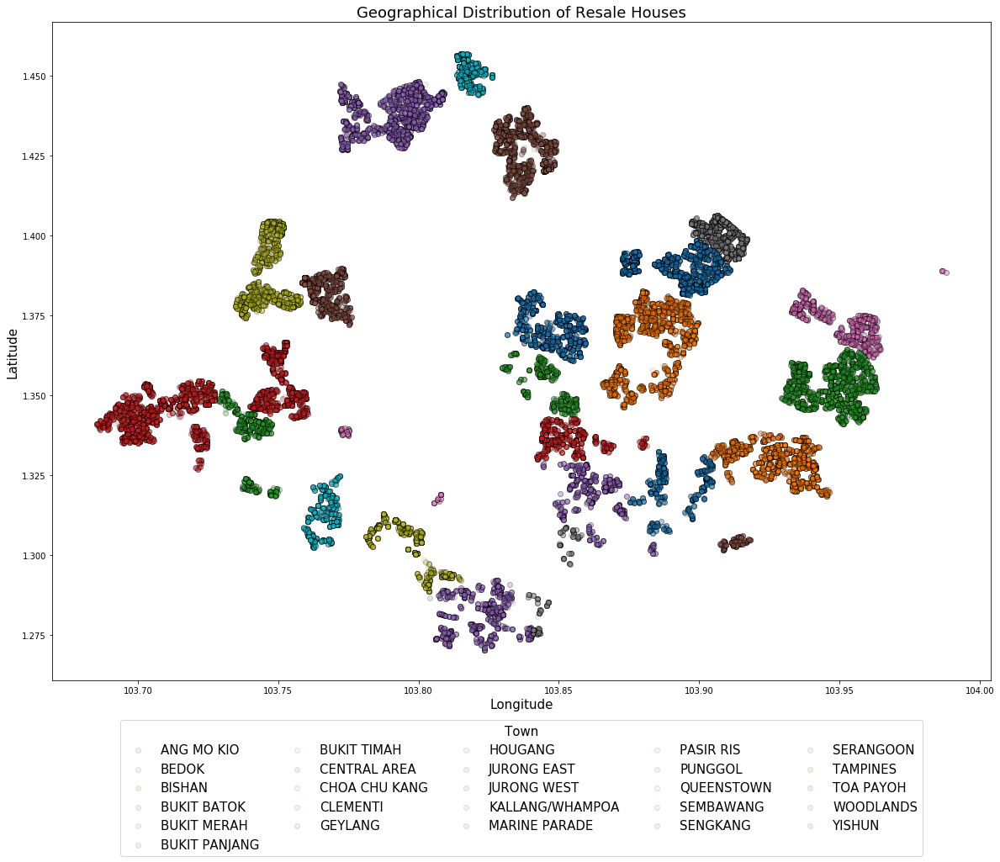

In [53]:
#Plot the latitude and longitude data to check if 
fig = plt.figure(figsize=(20,16))
ax = plt.subplot(111)

for town in hdb_w_latlong['town'].unique():
    ax.scatter(x=hdb_w_latlong[hdb_w_latlong['town']==town]['Longitude'], 
                y=hdb_w_latlong[hdb_w_latlong['town']==town]['Latitude'],
               label = town, alpha=0.1, edgecolors='k')
    
# Shrink current axis's height by 10% on the bottom
box = ax.get_position()
ax.set_position([box.x0, box.y0 + box.height * 0.1,
                 box.width, box.height * 0.9])

# Put a legend below current axis
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          ncol=5, title='Town',title_fontsize=15, fontsize = 15)

ax.set_title('Geographical Distribution of Resale Houses',fontsize=18)
ax.set_xlabel('Longitude', fontsize=15)
ax.set_ylabel('Latitude', fontsize=15)

In [54]:
plt.figure(figsize=(8,8))
plt.scatter(x=hdb_unique_blocks['Longitude'], y=hdb_unique_blocks['Latitude'],alpha=0.5, edgecolors='k')

mplleaflet.display()

C:\Users\kwanw\Anaconda3\envs\Env2\lib\site-packages\IPython\core\display.py:689: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


## MRT Stations

In [55]:
mrt = pd.read_csv('./MRT.csv',index_col=0)

In [56]:
mrt.head(20)

,line,station_name,year_opened,is_interchange
0,DT,MRT-BUKIT PANJANG,2015-12,0
1,DT,MRT-CASHEW,2015-12,0
2,DT,MRT-HILLVIEW,2015-12,0
3,DT,MRT-BEAUTY WORLD,2015-12,0
4,DT,MRT-KING ALBERT PARK,2015-12,0
5,DT,MRT-SIXTH AVENUE,2015-12,0
6,DT,MRT-TAN KAH KEE,2015-12,0
7,DT,MRT-BOTANIC GARDENS,2015-12,1
8,DT,MRT-STEVENS,2015-12,0
9,DT,MRT-NEWTON,2015-12,1


In [57]:
retrieve_lat_long(mrt['station_name'])

Saving JSON, 1 addresses done. Unable to save latitude from: MRT-BEAUTY WORLD 
Unable to save longtitude from: MRT-BEAUTY WORLD 
Unable to save latitude from: MRT-KING ALBERT PARK 
Unable to save longtitude from: MRT-KING ALBERT PARK 
Unable to save latitude from: MRT-SIXTH AVENUE 
Unable to save longtitude from: MRT-SIXTH AVENUE 
Unable to save latitude from: MRT-TAN KAH KEE 
Unable to save longtitude from: MRT-TAN KAH KEE 
Unable to save latitude from: MRT-ROCHOR 
Unable to save longtitude from: MRT-ROCHOR 
Unable to save latitude from: MRT-BUGIS 
Unable to save longtitude from: MRT-BUGIS 
Unable to save latitude from: MRT-PROMENADE 
Unable to save longtitude from: MRT-PROMENADE 
Unable to save latitude from: MRT-DOWNTOWN 
Unable to save longtitude from: MRT-DOWNTOWN 
Unable to save latitude from: MRT-TELOK AYER 
Unable to save longtitude from: MRT-TELOK AYER 
Unable to save latitude from: MRT-FORT CANNING 
Unable to save longtitude from: MRT-FORT CANNING 
Unable to save latitude fro

Unable to save latitude from: MRT-FARRER PARK 
Unable to save longtitude from: MRT-FARRER PARK 
Unable to save latitude from: MRT-BOON KENG 
Unable to save longtitude from: MRT-BOON KENG 
Unable to save latitude from: MRT-POTONG PASIR 
Unable to save longtitude from: MRT-POTONG PASIR 
Unable to save latitude from: MRT-WOODLEIGH 
Unable to save longtitude from: MRT-WOODLEIGH 
Unable to save latitude from: MRT-SERANGOON 
Unable to save longtitude from: MRT-SERANGOON 
Unable to save latitude from: MRT-KOVAN 
Unable to save longtitude from: MRT-KOVAN 
Unable to save latitude from: MRT-HOUGANG 
Unable to save longtitude from: MRT-HOUGANG 
Unable to save latitude from: MRT-BUANGKOK 
Unable to save longtitude from: MRT-BUANGKOK 
Unable to save latitude from: MRT-SENGKANG 
Unable to save longtitude from: MRT-SENGKANG 
Unable to save latitude from: MRT-PUNGGOL 
Unable to save longtitude from: MRT-PUNGGOL 
Saving JSON, 141 addresses done. All addresses completed.


In [58]:
mrt_resp = requests.get('https://geocoder.api.here.com/6.2/geocode.json?app_id=MiFDAY5K9P6nJCnzSgla&app_code=890Xp-BxGomgH4a9UP3rfg&searchtext=FORT CANNING MRT STATION')
mrt_resp.status_code

200

In [59]:
json.loads(mrt_resp.text)

{'Response': {'MetaInfo': {'Timestamp': '2019-03-04T12:18:14.733+0000'},
  'View': []}}

<div class="alert alert -block alert-warning">
    MRT-STATION NAME was the suggested format from searches on the HERE WeGo Andriod App, but even after trying a few different name formats it seemed like the API was unable to retrieve geodata of many MRT stations. Switched to Google Maps Geodata API (HERE Maps was used initially due to high monthly request cap, Google Maps only has one-time free credits)
</div>

## MRT Data from Google Maps Geodata API

In [60]:
mrt = pd.read_csv('./MRT.csv',index_col=0)

In [61]:
mrt['station_name'] = [name.replace('MRT-','')+' MRT STATION SINGAPORE' for name in mrt['station_name']]

In [62]:
mrt['station_name'].head()

0       BUKIT PANJANG  MRT STATION SINGAPORE
1              CASHEW  MRT STATION SINGAPORE
2            HILLVIEW  MRT STATION SINGAPORE
3        BEAUTY WORLD  MRT STATION SINGAPORE
4    KING ALBERT PARK  MRT STATION SINGAPORE
Name: station_name, dtype: object

In [63]:
search_add='FORT CANNING MRT SINGAPORE'
api=

gmap_response = requests.get('https://maps.googleapis.com/maps/api/geocode/json?address={}&key={}'.format(search_add,api))

In [64]:
gmap_response.status_code

200

In [65]:
json.loads(gmap_response.text)

{'results': [{'address_components': [{'long_name': '170',
     'short_name': '170',
     'types': ['street_number']},
    {'long_name': 'River Valley Road',
     'short_name': 'River Valley Rd',
     'types': ['route']},
    {'long_name': 'Singapore River',
     'short_name': 'Singapore River',
     'types': ['neighborhood', 'political']},
    {'long_name': 'Singapore',
     'short_name': 'Singapore',
     'types': ['locality', 'political']},
    {'long_name': 'Singapore',
     'short_name': 'SG',
     'types': ['country', 'political']}],
   'formatted_address': '170 River Valley Rd, Singapore',
   'geometry': {'location': {'lat': 1.2921101, 'lng': 103.844762},
    'location_type': 'ROOFTOP',
    'viewport': {'northeast': {'lat': 1.293459080291502,
      'lng': 103.8461109802915},
     'southwest': {'lat': 1.290761119708498, 'lng': 103.8434130197085}}},
   'place_id': 'ChIJnaXn0bsZ2jERbAo_I0o1EjE',
   'plus_code': {'compound_code': '7RRV+RW Singapore',
    'global_code': '6PH57RRV+RW'}

In [66]:
print(json.loads(gmap_response.text)['results'][0]['geometry']['location']['lat'])
print(json.loads(gmap_response.text)['results'][0]['geometry']['location']['lng'])

1.2921101
103.844762


In [67]:
from time import sleep

In [68]:
def gmap_lat_long(series):
    """
    This function takes in a Series and sends requests to HERE Maps API to save retrieve geodata json as a text file and 
    address name, latitude and longitude as a csv file
    """
    #Create a dictionary to save JSON responses
    json_responses = {}
    
    #Create empty lists to concatenate to before they are turned into a DataFrame 
    #(computationally less intense then iteratively concatenating to a DataFrame)
    addresses = []
    latitudes = []
    longitudes = []
    
    api=
    
    #Iterate through the series of addresses
    for i,address in enumerate(series):
        #request geodata from Google Maps Geodata API
        response = requests.get('https://maps.googleapis.com/maps/api/geocode/json?address={}&key={}'.format(address,api))
        
        #if request is successful, save the full geodata JSON (keep the full data just in case)  
        if response.status_code == 200:
            json_responses[address]=json.loads(response.text)
            
            #Append the address, latitude and longitude information
            addresses.append(address)
            try:
                latitudes.append(json.loads(response.text)['results'][0]['geometry']['location']['lat'])
            except:
                print('Unable to save latitude from: {}'.format(address))
                latitudes.append(None)
            try:
                longitudes.append(json.loads(response.text)['results'][0]['geometry']['location']['lng'])
            except:
                print('Unable to save longtitude from: {}'.format(address))
                longitudes.append(None)
        else:
            #if response fails, print the address and the corresponding status code
            print(address, 'status: ', response.status_code)
            
            #Record JSON and geodata information as None
            json_responses[address]=None
            adresses.append(address)
            latitudes.append(None)
            longitudes.append(None)
        
        #Save retrieved information periodically
        if i%10 == 0:
            print('Saving JSON, {} addresses done.'.format(i+1),end=' ')
            
            #Save the full JSON response as text file (do not overwrite, have back-ups)
            with open('json_save_{}.txt'.format(i), 'w') as outfile:  
                json.dump(json_responses, outfile)
            
            #Create the DataFrame and save as csv (do not overwrite, have back-ups)
            lat_long = pd.DataFrame({'Address':addresses,'Latitude':latitudes,'Longitude':longitudes})
            lat_long.to_csv('lat_long_{}.csv'.format(i))
        
        #Sleep for 1 sec to prevent exceeding request limit
        if i%40 == 0:
            sleep(1)
    
    #After all addresses are complete, print message
    print('Saving JSON, {} addresses done. All addresses completed.'.format(i+1))
            
    #Save the full JSON response as text file 
    with open('gmap_json_save_complete.txt', 'w') as outfile:  
        json.dump(json_responses, outfile)

    #Create the DataFrame and save as csv
    lat_long = pd.DataFrame({'Address':addresses,'Latitude':latitudes,'Longitude':longitudes})
    lat_long.to_csv('gmap_lat_long_complete.csv')

In [69]:
gmap_lat_long(mrt['station_name'])

Saving JSON, 1 addresses done. Saving JSON, 11 addresses done. Saving JSON, 21 addresses done. Saving JSON, 31 addresses done. Saving JSON, 41 addresses done. Saving JSON, 51 addresses done. Saving JSON, 61 addresses done. Saving JSON, 71 addresses done. Saving JSON, 81 addresses done. Saving JSON, 91 addresses done. Saving JSON, 101 addresses done. Saving JSON, 111 addresses done. Saving JSON, 121 addresses done. Saving JSON, 131 addresses done. Saving JSON, 141 addresses done. Saving JSON, 141 addresses done. All addresses completed.


In [70]:
#Load the mrt lat long csv
mrt_df = pd.read_csv('./gmap_lat_long_complete.csv', index_col=0)

In [71]:
mrt_df.head()

,Address,Latitude,Longitude
0,BUKIT PANJANG MRT STATION SINGAPORE,1.276068,103.791904
1,CASHEW MRT STATION SINGAPORE,1.369976,103.764579
2,HILLVIEW MRT STATION SINGAPORE,1.363038,103.767413
3,BEAUTY WORLD MRT STATION SINGAPORE,1.341553,103.775747
4,KING ALBERT PARK MRT STATION SINGAPORE,1.335688,103.783193


In [72]:
mrt.head()

,line,station_name,year_opened,is_interchange
0,DT,BUKIT PANJANG MRT STATION SINGAPORE,2015-12,0
1,DT,CASHEW MRT STATION SINGAPORE,2015-12,0
2,DT,HILLVIEW MRT STATION SINGAPORE,2015-12,0
3,DT,BEAUTY WORLD MRT STATION SINGAPORE,2015-12,0
4,DT,KING ALBERT PARK MRT STATION SINGAPORE,2015-12,0


In [73]:
mrt_full = pd.concat([mrt,mrt_df],axis=1)

In [74]:
mrt_full.drop('Address', axis=1, inplace=True)

In [75]:
#Save the full mrt csv
mrt_full.to_csv('mrt_full.csv')

Text(0, 0.5, 'Latitude')

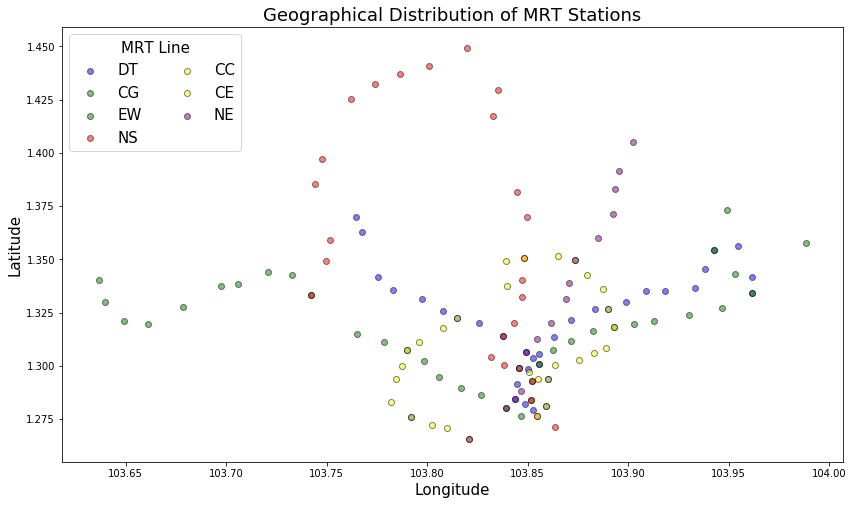

In [76]:
color_dict = {'DT':'blue','CG':'green','EW':'green','NS':'red','CC':'yellow','CE':'yellow','NE':'purple'}

#Plot the latitude and longitude data to check if 
fig = plt.figure(figsize=(14,8))
ax = plt.subplot(111)

for line in mrt_full['line'].unique():
    ax.scatter(x=mrt_full[mrt_full['line']==line]['Longitude'], 
                y=mrt_full[mrt_full['line']==line]['Latitude'],
               label = line, alpha=0.5, edgecolors='k',c=color_dict[line])

# Put a legend below current axis
ax.legend(loc='upper left', 
          ncol=2, title='MRT Line',title_fontsize=15, fontsize = 15)

ax.set_title('Geographical Distribution of MRT Stations',fontsize=18)
ax.set_xlabel('Longitude', fontsize=15)
ax.set_ylabel('Latitude', fontsize=15)

<div class='alert alert-block alert-danger'>
    No interchange at Pasir Panjang. Better double check the mrt data.
</div>

In [77]:
mrt_full[mrt_full['Latitude']<1.28]

,line,station_name,year_opened,is_interchange,Latitude,Longitude
0,DT,BUKIT PANJANG MRT STATION SINGAPORE,2015-12,0,1.276068,103.791904
15,DT,DOWNTOWN MRT STATION SINGAPORE,2013-12,0,1.279458,103.852813
50,EW,TANJONG PAGAR MRT STATION SINGAPORE,1987-11,0,1.276342,103.846792
93,NS,MARINA BAY MRT STATION SINGAPORE,1989-12,1,1.276521,103.854701
94,NS,MARINA SOUTH PIER MRT STATION SINGAPORE,2014-11,0,1.271409,103.863631
95,CC,HARBOURFRONT MRT STATION SINGAPORE,2011-10,1,1.265604,103.820857
96,CC,TELOK BLANGAH MRT STATION SINGAPORE,2011-10,0,1.270715,103.809878
97,CC,LABRADOR PARK MRT STATION SINGAPORE,2011-10,0,1.272126,103.802557
98,CC,PASIR PANJANG MRT STATION SINGAPORE,2011-10,0,1.276068,103.791904
124,CE,MARINA BAY MRT STATION SINGAPORE,2012-01,1,1.276521,103.854701


<div class='alert alert-block alert-danger'>
    Bukit Panjang in the south?
</div>

In [78]:
with open('./gmap_json_save_complete.txt') as json_file:  
    data = json.load(json_file)

data

{'BUKIT PANJANG  MRT STATION SINGAPORE': {'results': [{'address_components': [{'long_name': 'Pasir Panjang (CC26) MRT Station',
      'short_name': 'Pasir Panjang (CC26) MRT Station',
      'types': ['establishment',
       'point_of_interest',
       'subway_station',
       'transit_station']},
     {'long_name': 'Queenstown',
      'short_name': 'Queenstown',
      'types': ['neighborhood', 'political']},
     {'long_name': 'Singapore',
      'short_name': 'Singapore',
      'types': ['locality', 'political']},
     {'long_name': 'Singapore',
      'short_name': 'SG',
      'types': ['country', 'political']}],
    'formatted_address': 'Pasir Panjang (CC26) MRT Station, Singapore',
    'geometry': {'location': {'lat': 1.2760684, 'lng': 103.7919037},
     'location_type': 'GEOMETRIC_CENTER',
     'viewport': {'northeast': {'lat': 1.277417380291502,
       'lng': 103.7932526802915},
      'southwest': {'lat': 1.274719419708498, 'lng': 103.7905547197085}}},
    'place_id': 'ChIJf0qJ7Lsb

In [79]:
data['BUKIT PANJANG  MRT STATION SINGAPORE']['results'][0]['address_components'][0]['long_name']

'Pasir Panjang (CC26) MRT Station'

In [80]:
#Create lists of the search terms entered into Google Maps API and the name of the address retrieved by the API
search_terms = list(data.keys())
retrieved_name = [data[name]['results'][0]['address_components'][0]['long_name'] for name in data]

In [81]:
check_mrt = pd.DataFrame({'Search':search_terms, 'Retrieved':retrieved_name})
check_mrt.head()

,Search,Retrieved
0,BUKIT PANJANG MRT STATION SINGAPORE,Pasir Panjang (CC26) MRT Station
1,CASHEW MRT STATION SINGAPORE,Cashew MRT Station
2,HILLVIEW MRT STATION SINGAPORE,Hillview Stn
3,BEAUTY WORLD MRT STATION SINGAPORE,Beauty World
4,KING ALBERT PARK MRT STATION SINGAPORE,King Albert Park MRT Station


In [82]:
check_mrt.shape

(119, 2)

In [83]:
#Compare the first 2 words for the Beauty World search
check_mrt.iloc[3]['Search'].split()[0].lower()+check_mrt.iloc[3]['Search'].split()[1].lower() == check_mrt.iloc[3]['Retrieved'].split()[0].lower()+check_mrt.iloc[3]['Retrieved'].split()[1].lower()

True

In [84]:
#Compare the first 2 words for the Bukit Panjang search
check_mrt.iloc[0]['Search'].split()[0].lower()+check_mrt.iloc[0]['Search'].split()[1].lower() == check_mrt.iloc[0]['Retrieved'].split()[0].lower()+check_mrt.iloc[0]['Retrieved'].split()[1].lower()

False

In [85]:
def check_mrt_rows(row):
    """
    DOCSTRING: This function checks whether the search and retrieved terms match and assigns a binary result
    INPUT: row from the MRT DataFrame
    OUTPUT: binary output of whether search and retrieved terms match
    """
    #For search terms with 6 words (eg Haw Par Villa MRT station Singapore)
    if len(row[0].split())== 6:
        try:
            #compare first 3 words
            if row[0].split()[0].lower()+row[0].split()[1].lower()+row[0].split()[2].lower()==row[1].split()[0].lower()+row[1].split()[1].lower()+row[1].split()[2].lower():
                return 1
            else:
                return 0
        except:
            return 0
    
    #For search terms with 5 words (eg Bukit Panjang MRT station Singapore)
    if len(row[0].split())== 5:
        try:
            #compare first 2 words
            if row[0].split()[0].lower()+row[0].split()[1].lower()==row[1].split()[0].lower()+row[1].split()[1].lower():
                return 1
            else:
                return 0
        except:
            return 0
        
    #For search terms with 4 words (eg Cashew MRT station Singapore)  
    elif len(row[0].split())== 4:
        try:
            #compare first words
            if row[0].split()[0].lower()==row[1].split()[0].lower():
                return 1
            else:
                return 0
        except:
            return 0
    
    else:
        return 0
    

In [86]:
scores = check_mrt.apply(check_mrt_rows,axis=1)

In [87]:
check_mrt['check'] = scores

In [88]:
to_correct = check_mrt[check_mrt['check'] != 1].copy()
to_correct

,Search,Retrieved,check
0,BUKIT PANJANG MRT STATION SINGAPORE,Pasir Panjang (CC26) MRT Station,0
21,BENDEEMER MRT STATION SINGAPORE,Bendemeer MRT Station,0
26,KAKI BUKIT MRT STATION SINGAPORE,Jalan Damai,0
27,BEDOK NORTH MRT STATION SINGAPORE,651,0
31,TAMPINES EAST MRT STATION SINGAPORE,230,0
60,PIONEER MRT STATION SINGAPORE,Singapore,0
61,JOO KOON MRT STATION SINGAPORE,79-85,0
64,TUAS WEST ROAD MRT STATION SINGAPORE,135,0
65,TUAS LINK MRT STATION SINGAPORE,21,0
67,BUKIT GOMBAK MRT STATION SINGAPORE,Singapore,0


In [89]:
#Bendeemer MRT and One North are fine
to_correct.drop([21,94], inplace=True)

In [90]:
#Remaining stations to correct
to_correct

,Search,Retrieved,check
0,BUKIT PANJANG MRT STATION SINGAPORE,Pasir Panjang (CC26) MRT Station,0
26,KAKI BUKIT MRT STATION SINGAPORE,Jalan Damai,0
27,BEDOK NORTH MRT STATION SINGAPORE,651,0
31,TAMPINES EAST MRT STATION SINGAPORE,230,0
60,PIONEER MRT STATION SINGAPORE,Singapore,0
61,JOO KOON MRT STATION SINGAPORE,79-85,0
64,TUAS WEST ROAD MRT STATION SINGAPORE,135,0
65,TUAS LINK MRT STATION SINGAPORE,21,0
67,BUKIT GOMBAK MRT STATION SINGAPORE,Singapore,0
118,PUNGGOL MRT STATION SINGAPORE,Singapore,0


In [91]:
#Retrieve the latlong information of the stations to be corrected
mrt_full[mrt_full['station_name'].isin(to_correct['Search'].tolist())]

,line,station_name,year_opened,is_interchange,Latitude,Longitude
0,DT,BUKIT PANJANG MRT STATION SINGAPORE,2015-12,0,1.276068,103.791904
26,DT,KAKI BUKIT MRT STATION SINGAPORE,2017-10,0,1.334927,103.909016
27,DT,BEDOK NORTH MRT STATION SINGAPORE,2017-10,0,1.335139,103.918397
31,DT,TAMPINES EAST MRT STATION SINGAPORE,2017-10,0,1.356308,103.954651
63,EW,PIONEER MRT STATION SINGAPORE,2009-02,0,1.337526,103.697442
64,EW,JOO KOON MRT STATION SINGAPORE,2009-02,0,1.327751,103.678318
67,EW,TUAS WEST ROAD MRT STATION SINGAPORE,2017-06,0,1.330048,103.639617
68,EW,TUAS LINK MRT STATION SINGAPORE,2017-06,0,1.340317,103.636866
71,NS,BUKIT GOMBAK MRT STATION SINGAPORE,1990-03,0,1.359037,103.751828
140,NE,PUNGGOL MRT STATION SINGAPORE,2003-06,0,1.405170,103.902356


In [92]:
#Check Google Maps manually
#Correct BUKIT PANJANG MRT STATION SINGAPORE
mrt_full.at[0,'Latitude'] = 1.378626
mrt_full.at[0,'Longitude'] = 103.761431

#KAKI BUKIT MRT STATION SINGAPORE is correct
#BEDOK NORTH MRT STATION SINGAPORE is correct
#TAMPINES EAST MRT STATION SINGAPORE is correct
#PIONEER MRT STATION SINGAPORE is correct
#JOO KOON MRT STATION SINGAPORE is correct
#TUAS LINK MRT STATION SINGAPORE is correct
#BUKIT GOMBAK MRT STATION SINGAPORE is correct
#PUNGGOL MRT STATION SINGAPORE is correct

In [93]:
mrt_full.head()

,line,station_name,year_opened,is_interchange,Latitude,Longitude
0,DT,BUKIT PANJANG MRT STATION SINGAPORE,2015-12,0,1.378626,103.761431
1,DT,CASHEW MRT STATION SINGAPORE,2015-12,0,1.369976,103.764579
2,DT,HILLVIEW MRT STATION SINGAPORE,2015-12,0,1.363038,103.767413
3,DT,BEAUTY WORLD MRT STATION SINGAPORE,2015-12,0,1.341553,103.775747
4,DT,KING ALBERT PARK MRT STATION SINGAPORE,2015-12,0,1.335688,103.783193


In [94]:
#Save the corrected full mrt csv
mrt_full.to_csv('mrt_full.csv')

In [95]:
plt.figure(figsize=(8,8))
plt.scatter(x=mrt_full['Longitude'],y=mrt_full['Latitude'], alpha=0.5,edgecolors='k')

mplleaflet.display()

C:\Users\kwanw\Anaconda3\envs\Env2\lib\site-packages\IPython\core\display.py:689: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


## Caculate distance between MRT station and flat

In [96]:
from geopy.distance import geodesic

In [97]:
mrt_full = pd.read_csv('./mrt_full.csv',index_col=0)

In [98]:
hdb_w_latlong.iloc[0][['HERE_address','Latitude','Longitude']]

HERE_address    174 ANG MO KIO AVE 4 Singapore
Latitude                               1.37541
Longitude                              103.837
Name: 0, dtype: object

In [99]:
mrt_full.iloc[0][['station_name','Latitude','Longitude']]

station_name    BUKIT PANJANG  MRT STATION SINGAPORE
Latitude                                     1.37863
Longitude                                    103.761
Name: 0, dtype: object

In [100]:
#Calculate dist and verify with Google maps
amk_ave4_174 = (1.37541, 103.837)
bp_mrt = (1.37863,103.761)

print(geodesic(amk_ave4_174,bp_mrt).km)

8.465345437685844


In [101]:
def closest_w_dist(address_w_latlong,amenity_w_latlong,distance):
    """
    This function takes in a DataFrame of flats with latlong, amenities with latlong and 
    a float or int number for the distance to search within.
    
    It return a dictionary with the flat address as the key and the value being a list of the name of closest amenity and the distance from it.
    """
    #Create dictionary to return the closest MRT and distance, the key is the flat address
    results = {}
    
    for i in range(len(address_w_latlong)):
        #Extract the flat name and latlong
        address_name = address_w_latlong.iloc[i,0]
        latitude = address_w_latlong.iloc[i,1]
        longitude = address_w_latlong.iloc[i,2]
        address = (latitude,longitude)

        #closest amenity, to be replaced each time a closer amenity is found
        closest = ['place',5]

        #Create subset of amenities within given distance
        amenity_in_range = amenity_w_latlong[(abs(amenity_w_latlong[amenity_w_latlong.columns[1]]-latitude)<0.009*distance) 
                                      & (abs(amenity_w_latlong[amenity_w_latlong.columns[2]]-longitude)<0.009*distance)]
        
        #Iterate through the subset of amenities within given distance to retrieve the closest one
        for index in range(len(amenity_in_range)):
            amenity_name = amenity_in_range.iloc[index,0]
            amenity = (amenity_in_range.iloc[index,1],amenity_in_range.iloc[index,2])

            #Replace closest if the current amenity is closer
            if geodesic(address,amenity).km < closest[1]:
                closest[0] = amenity_name
                closest[1] = round(geodesic(address,amenity).km,4)
        
        #Add the result to the dictionary
        results[address_name]=closest
    
    #Return the dictionary of block and nearest amenity with distance
    return results

In [102]:
hdb_w_latlong[['HERE_address','Latitude','Longitude']].tail()

,HERE_address,Latitude,Longitude
79095,782A WOODLANDS CRES Singapore,1.44735,103.80254
79096,117 MARSILING RISE Singapore,1.43836,103.78007
79097,348A YISHUN AVE 11 Singapore,1.42719,103.84126
79098,347B YISHUN AVE 11 Singapore,1.42789,103.84212
79099,348C YISHUN AVE 11 Singapore,1.42697,103.84230


In [103]:
#Test on a few addresses
mrt_dict = closest_w_dist(hdb_w_latlong[['HERE_address','Latitude','Longitude']].tail(),mrt_full[['station_name','Latitude','Longitude']],5)
mrt_dict

{'782A WOODLANDS CRES Singapore': ['ADMIRALTY  MRT STATION SINGAPORE', 0.7653],
 '117 MARSILING RISE Singapore': ['WOODLANDS  MRT STATION SINGAPORE', 0.7342],
 '348A YISHUN AVE 11 Singapore': ['YISHUN  MRT STATION SINGAPORE', 0.7404],
 '347B YISHUN AVE 11 Singapore': ['YISHUN  MRT STATION SINGAPORE', 0.8097],
 '348C YISHUN AVE 11 Singapore': ['YISHUN  MRT STATION SINGAPORE', 0.8575]}

In [104]:
#Create DataFrame of unique blocks
blocks_unique = hdb_w_latlong[['HERE_address','Latitude','Longitude']].drop_duplicates().copy()

In [105]:
blocks_unique.shape

(8512, 3)

In [106]:
mrt_closest = closest_w_dist(blocks_unique,mrt_full[['station_name','Latitude','Longitude']],5)
mrt_closest 

{'174 ANG MO KIO AVE 4 Singapore': ['YIO CHU KANG  MRT STATION SINGAPORE',
  1.0909],
 '541 ANG MO KIO AVE 10 Singapore': ['ANG MO KIO  MRT STATION SINGAPORE',
  0.826],
 '163 ANG MO KIO AVE 4 Singapore': ['YIO CHU KANG  MRT STATION SINGAPORE',
  1.1368],
 '446 ANG MO KIO AVE 10 Singapore': ['ANG MO KIO  MRT STATION SINGAPORE',
  0.6879],
 '557 ANG MO KIO AVE 10 Singapore': ['ANG MO KIO  MRT STATION SINGAPORE',
  0.9339],
 '603 ANG MO KIO AVE 5 Singapore': ['YIO CHU KANG  MRT STATION SINGAPORE',
  1.049],
 '709 ANG MO KIO AVE 8 Singapore': ['ANG MO KIO  MRT STATION SINGAPORE',
  0.2418],
 '333 ANG MO KIO AVE 1 Singapore': ['ANG MO KIO  MRT STATION SINGAPORE',
  0.9482],
 '109 ANG MO KIO AVE 4 Singapore': ['ANG MO KIO  MRT STATION SINGAPORE',
  1.2687],
 '564 ANG MO KIO AVE 3 Singapore': ['ANG MO KIO  MRT STATION SINGAPORE',
  1.1043],
 '218 ANG MO KIO AVE 1 Singapore': ['ANG MO KIO  MRT STATION SINGAPORE',
  1.0167],
 '556 ANG MO KIO AVE 10 Singapore': ['ANG MO KIO  MRT STATION SINGAPO

In [107]:
import pickle 

#Save the dictionary as a pickle file
pickle_out = open('mrt_dist_dict.pickle','wb')
pickle.dump(mrt_closest, pickle_out)
pickle_out.close()

In [108]:
unique_hdb_mrt_dist = pd.DataFrame({'HERE_address':list(mrt_closest.keys()),
                                   'closest_mrt':[value[0] for value in mrt_closest.values()],
                                   'dist_mrt_km':[value[1] for value in mrt_closest.values()]})

unique_hdb_mrt_dist.tail()

,HERE_address,closest_mrt,dist_mrt_km
8507,782A WOODLANDS CRES Singapore,ADMIRALTY MRT STATION SINGAPORE,0.7653
8508,117 MARSILING RISE Singapore,WOODLANDS MRT STATION SINGAPORE,0.7342
8509,348A YISHUN AVE 11 Singapore,YISHUN MRT STATION SINGAPORE,0.7404
8510,347B YISHUN AVE 11 Singapore,YISHUN MRT STATION SINGAPORE,0.8097
8511,348C YISHUN AVE 11 Singapore,YISHUN MRT STATION SINGAPORE,0.8575


In [109]:
#Check for unusual values/variance
unique_hdb_mrt_dist['dist_mrt_km'].describe()

count    8512.000000
mean        0.745625
std         0.413323
min         0.014100
25%         0.446600
50%         0.667850
75%         0.954050
max         3.481900
Name: dist_mrt_km, dtype: float64

In [110]:
unique_hdb_mrt_dist[unique_hdb_mrt_dist['dist_mrt_km']<0.03]

,HERE_address,closest_mrt,dist_mrt_km
4944,6 FARRER RD Singapore,FARRER ROAD MRT STATION SINGAPORE,0.0141
5471,101 TOWNER RD Singapore,BOON KENG MRT STATION SINGAPORE,0.0216


In [111]:
unique_hdb_mrt_dist[unique_hdb_mrt_dist['dist_mrt_km']>3]

,HERE_address,closest_mrt,dist_mrt_km
649,5 CHANGI VILLAGE RD Singapore,CHANGI AIRPORT MRT STATION SINGAPORE,3.4622
1601,4 CHANGI VILLAGE RD Singapore,CHANGI AIRPORT MRT STATION SINGAPORE,3.4819
5479,1 CHANGI VILLAGE RD Singapore,CHANGI AIRPORT MRT STATION SINGAPORE,3.4006


<div class='alert alert-block alert-info'>
    Checking the above locations against Google Maps, some blocks are literally next to the MRT, while those in the East tend to be much further from MRT stations
</div>

In [112]:
#Merge the latlong data with the full HDB data
hdb_ll_mrt = hdb_w_latlong.merge(unique_hdb_mrt_dist,how='inner',on='HERE_address')

In [113]:
#Save the merged DataFrame as a csv
hdb_ll_mrt.to_csv('hdb_ll_mrt.csv')

## Nearest Carpark

In [114]:
cp = pd.read_csv('./hdb-carpark-information/hdb-carpark-information.csv')

In [115]:
cp.head()

,car_park_no,address,x_coord,y_coord,car_park_type,type_of_parking_system,short_term_parking,free_parking,night_parking,car_park_decks,gantry_height,car_park_basement
0,ACB,BLK 270/271 ALBERT CENTRE BASEMENT CAR PARK,30314.7936,31490.4942,BASEMENT CAR PARK,ELECTRONIC PARKING,WHOLE DAY,NO,YES,1,1.8,Y
1,ACM,BLK 98A ALJUNIED CRESCENT,33758.4143,33695.5198,MULTI-STOREY CAR PARK,ELECTRONIC PARKING,WHOLE DAY,SUN & PH FR 7AM-10.30PM,YES,5,2.1,N
2,AH1,BLK 101 JALAN DUSUN,29257.7203,34500.3599,SURFACE CAR PARK,ELECTRONIC PARKING,WHOLE DAY,SUN & PH FR 7AM-10.30PM,YES,0,0.0,N
3,AK19,BLOCK 253 ANG MO KIO STREET 21,28185.4359,39012.6664,SURFACE CAR PARK,COUPON PARKING,7AM-7PM,NO,NO,0,0.0,N
4,AK31,BLK 302/348 ANG MO KIO ST 31,29482.0290,38684.1754,SURFACE CAR PARK,COUPON PARKING,NO,NO,NO,0,0.0,N


<div class='alert alert-bloack alert-info'>
    According to the accompanying metadata file, <strong>x_coord</strong> and <strong>y_coord</strong> refer to the EPSG:3414 coordinate system

In [116]:
#Use the OneMap SG api to convert the geodata from the EPSG:3414 coordinate system to latitude and longitude (WGS84)
x=30314.7936
y=31490.4942

response = requests.get("https://developers.onemap.sg/commonapi/convert/3414to4326?X={}&Y={}".format(x,y))
response.status_code

200

In [117]:
response.text

'{"latitude":1.3010632720874935,"longitude":103.85411804993093}'

In [118]:
#Retrieve the latitude and longitude of hte first carpark
print('Latitude: ',json.loads(response.text)['latitude'])
print('Longitude: ',json.loads(response.text)['longitude'])

Latitude:  1.3010632720874935
Longitude:  103.85411804993093


In [119]:
#check the total number of carparks
len(cp)

2108

In [120]:
from time import sleep

In [121]:
#Create lists to append the relevant information to
cp_address = []
cp_latitude = []
cp_longitude = []

for num in range(len(cp)):
    cp_address.append(cp.iloc[num]['address'])
    
    x=cp.iloc[num]['x_coord']
    y=cp.iloc[num]['y_coord']
    
    try:
        response = requests.get("https://developers.onemap.sg/commonapi/convert/3414to4326?X={}&Y={}".format(x,y))
        cp_latitude.append(json.loads(response.text)['latitude'])
        cp_longitude.append(json.loads(response.text)['longitude'])
    except:
        cp_latitude.append(None)
        cp_longitude.append(None)
    
    
    #max number of requests per minute is 250, sleep for 1 min every 240 requests and save the retrieved data
    finally:
        if (num+1)%240==0:
            #Compile retrieved latlong into a DataFrame
            cp_latlong = pd.DataFrame({'carpark_name':cp_address,'carpark_latitude':cp_latitude,'carpark_longitude':cp_longitude})

            #Save the DataFrame in a csv
            cp_latlong.to_csv('cp_retrieved_{}.csv'.format(num+1))
            #print a statement to indicate progress
            print('{} entries saved.'.format(num+1),end=' ')

            #sleep for a minute
            sleep(60)

#Compile retrieved latlong into a DataFrame
cp_latlong = pd.DataFrame({'carpark_name':cp_address,'carpark_latitude':cp_latitude,'carpark_longitude':cp_longitude})
#Save the DataFrame in a csv
cp_latlong.to_csv('cp_latlong.csv')        
print('\n{} entries saved. All entries completed'.format(num+1))

240 entries saved. 480 entries saved. 720 entries saved. 960 entries saved. 1200 entries saved. 1440 entries saved. 1680 entries saved. 1920 entries saved. 
2108 entries saved. All entries completed


In [122]:
#Check for unusual values/variance
cp_latlong.describe()

,carpark_latitude,carpark_longitude
count,2108.000000,2108.000000
mean,1.357576,103.839487
std,0.043846,0.069546
min,1.270613,103.685408
25%,1.326481,103.788033
50%,1.353412,103.844916
75%,1.384323,103.893083
max,1.456622,103.988454


In [123]:
#Plot the geographical distribution of the carparks and check that they are within SG
plt.figure(figsize=(8,8))
plt.scatter(x=cp_latlong['carpark_longitude'],y=cp_latlong['carpark_latitude'], alpha=0.5,edgecolors='k')

mplleaflet.display()

C:\Users\kwanw\Anaconda3\envs\Env2\lib\site-packages\IPython\core\display.py:689: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


In [124]:
cp_closest = closest_w_dist(blocks_unique,cp_latlong,1.5)

In [125]:
cp_closest

{'174 ANG MO KIO AVE 4 Singapore': ['BLK 173/176 ANG MO KIO AVE 4', 0.1152],
 '541 ANG MO KIO AVE 10 Singapore': ['BLK 540/546 ANG MO KIO ST 54', 0.0417],
 '163 ANG MO KIO AVE 4 Singapore': ['BLK 157/163 ANG MO KIO AVE 4', 0.0913],
 '446 ANG MO KIO AVE 10 Singapore': ['BLK 446/449/453 ANG MO KIO ST 43',
  0.0238],
 '557 ANG MO KIO AVE 10 Singapore': ['BLK 555/559 ANG MO KIO STREET 54',
  0.0146],
 '603 ANG MO KIO AVE 5 Singapore': ['BLK 601/604/603 ANG MO KIO AVE 5',
  0.0174],
 '709 ANG MO KIO AVE 8 Singapore': ['BLK 712A ANG MO KIO AVE 3/6', 0.088],
 '333 ANG MO KIO AVE 1 Singapore': ['BLK 330/337 ANG MO KIO AVE 8', 0.1224],
 '109 ANG MO KIO AVE 4 Singapore': ['BLK 108/109/110 ANG MO KIO ST 11',
  0.0232],
 '564 ANG MO KIO AVE 3 Singapore': ['BLK 562/565/560 ANG MO KIO STREET 54',
  0.0311],
 '218 ANG MO KIO AVE 1 Singapore': ['BLK 217/220 ANG MO KIO AVENUE 1', 0.0671],
 '556 ANG MO KIO AVE 10 Singapore': ['BLK 548/552/556 ANG MO KIO STREET 54',
  0.0272],
 '156 ANG MO KIO AVE 4 Sing

In [126]:
#Save the dictionary as a pickle file
pickle_out = open('cp_dist_dict.pickle','wb')
pickle.dump(cp_closest, pickle_out)
pickle_out.close()

In [127]:
#
unique_hdb_cp_dist = pd.DataFrame({'HERE_address':list(cp_closest.keys()),
                                   'closest_cp':[value[0] for value in cp_closest.values()],
                                   'dist_cp_km':[value[1] for value in cp_closest.values()]})

In [128]:
#Check for unusual values/variance
unique_hdb_cp_dist.describe()

,dist_cp_km
count,8512.000000
mean,0.080735
std,0.043508
min,0.000500
25%,0.049200
50%,0.076200
75%,0.106700
max,0.312100


In [129]:
unique_hdb_cp_dist[unique_hdb_cp_dist['dist_cp_km']<0.01].head()

,HERE_address,closest_cp,dist_cp_km
30,584 ANG MO KIO AVE 3 Singapore,BLK 584/586 ANG MO KIO ST 51,0.0050
44,573 ANG MO KIO AVE 3 Singapore,BLK 571/73 ANG MO KIO ST 51,0.0043
103,517 BEDOK NTH AVE 2 Singapore,"BLK 512 TO 518, 554 BEDOK NORTH AVE 2",0.0024
235,27 LIM LIAK ST Singapore,KERBSIDE TIONG BAHRU EST,0.0046
327,409 CHOA CHU KANG AVE 3 Singapore,BLK 409/413 CHOA CHU KANG AVE 3,0.0034


<div class="alert alert-block alert-warning">
    The range of values for carpark distance is really small and given that I'm taking a point distance for wide spaces such as open air carparks on the ground floor the error might be rather significant. It is unlikely to be a useful feature for modelling.
</div>

In [130]:
hdb_ll_mrt.head()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,HERE_address,Latitude,Longitude,closest_mrt,dist_mrt_km
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,07 TO 09,60.0,Improved,1986,70,255000.0,174 ANG MO KIO AVE 4 Singapore,1.37541,103.8374,YIO CHU KANG MRT STATION SINGAPORE,1.0909
1,2015-12,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,10 TO 12,60.0,Improved,1986,69,275000.0,174 ANG MO KIO AVE 4 Singapore,1.37541,103.8374,YIO CHU KANG MRT STATION SINGAPORE,1.0909
2,2016-05,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,04 TO 06,69.0,Improved,1986,68,310000.0,174 ANG MO KIO AVE 4 Singapore,1.37541,103.8374,YIO CHU KANG MRT STATION SINGAPORE,1.0909
3,2016-06,ANG MO KIO,2 ROOM,174,ANG MO KIO AVE 4,07 TO 09,45.0,Improved,1986,68,253000.0,174 ANG MO KIO AVE 4 Singapore,1.37541,103.8374,YIO CHU KANG MRT STATION SINGAPORE,1.0909
4,2016-11,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,04 TO 06,61.0,Improved,1986,68,290000.0,174 ANG MO KIO AVE 4 Singapore,1.37541,103.8374,YIO CHU KANG MRT STATION SINGAPORE,1.0909


In [131]:
#Merge the carpark information with the main DataFrame with latlong of hdb and closest mrt
hdb_ll_mrt_cp = hdb_ll_mrt.merge(unique_hdb_cp_dist,how='inner',on='HERE_address')

In [132]:
#Check the entries
hdb_ll_mrt_cp.tail()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,HERE_address,Latitude,Longitude,closest_mrt,dist_mrt_km,closest_cp,dist_cp_km
79095,2018-12,WOODLANDS,4 ROOM,782A,WOODLANDS CRES,07 TO 09,92.0,Model A,2015,95,396500.0,782A WOODLANDS CRES Singapore,1.44735,103.80254,ADMIRALTY MRT STATION SINGAPORE,0.7653,BLK 782 WOODLANDS CRESCENT,0.1487
79096,2018-12,WOODLANDS,EXECUTIVE,117,MARSILING RISE,01 TO 03,170.0,Apartment,1995,75,685000.0,117 MARSILING RISE Singapore,1.43836,103.78007,WOODLANDS MRT STATION SINGAPORE,0.7342,BLK 114-133 MARSILING RISE,0.0861
79097,2018-12,YISHUN,4 ROOM,348A,YISHUN AVE 11,10 TO 12,92.0,DBSS,2013,93,600000.0,348A YISHUN AVE 11 Singapore,1.42719,103.84126,YISHUN MRT STATION SINGAPORE,0.7404,BLK 347 YISHUN AVE 11,0.1563
79098,2018-12,YISHUN,4 ROOM,347B,YISHUN AVE 11,10 TO 12,92.0,DBSS,2013,93,530000.0,347B YISHUN AVE 11 Singapore,1.42789,103.84212,YISHUN MRT STATION SINGAPORE,0.8097,BLK 347 YISHUN AVE 11,0.0711
79099,2018-12,YISHUN,5 ROOM,348C,YISHUN AVE 11,13 TO 15,112.0,DBSS,2013,93,710000.0,348C YISHUN AVE 11 Singapore,1.42697,103.84230,YISHUN MRT STATION SINGAPORE,0.8575,BLK 347 YISHUN AVE 11,0.0694


In [133]:
#Save the DataFrame
hdb_ll_mrt_cp.to_csv('hdb_ll_mrt_cp.csv')